# Grab some data we need from the RDS

In [1]:
library(Seurat)

Attaching SeuratObject



In [2]:
library(ggplot2)

In [3]:
# load('20220831_Brenner_mouse_scRNA_initial_clustering.RData')
NPC = readRDS('npc_filtered.rds')
NPC

An object of class Seurat 
17556 features across 9502 samples within 1 assay 
Active assay: RNA (17556 features, 2000 variable features)
 3 dimensional reductions calculated: pca, tsne, umap

In [4]:
head(NPC@meta.data)

,orig.ident,nCount_RNA,nFeature_RNA,percent.mt,RNA_snn_res.0.5,seurat_clusters
,<chr>,<dbl>,<int>,<dbl>,<fct>,<fct>
NPC_1215_AAACCCACATAAGATG,NPC_1215,9837,2341,4.788045,9,9
NPC_1215_AAACGCTTCGCACGGT,NPC_1215,12615,3072,3.281807,9,9
NPC_1215_AAACGCTTCGGCGATC,NPC_1215,6734,2288,4.054054,2,2
NPC_1215_AAAGGATCATATGCGT,NPC_1215,2579,1034,4.536642,4,4
NPC_1215_AAAGGGCAGCTGAAGC,NPC_1215,2916,1333,4.801097,15,15
NPC_1215_AAAGGTAAGCCAGTAG,NPC_1215,1694,804,3.246753,6,6


In [5]:
# Idents(NPC) = NPC@meta.data$RNA_snn_res.0.5
table(Idents(NPC))


   0    1    2    3    4    5    6    7    8    9   10   11   12   13   14   15 
2218 1122  943  665  663  622  616  535  472  446  434  182  140  133  125   83 
  16   17 
  64   39 

In [6]:
# cluster_markers = FindAllMarkers(NPC)
# head(cluster_markers)

In [7]:
table(NPC@meta.data$orig.ident)


NPC_1215 NPC_2525 NPC_2527 NPC_2722 NPC_2744 NPC_2891 NPC_2999 NPC_3025 
     897      541      799     1261      662      991     1831     1822 
NPC_3084 
     698 

# add condition

orig_ident2condition = {'NPC_1215':'Foz_R8','NPC_2891':'Foz_wk12',
                       'NPC_3084':'Foz_wk0','NPC_3025':'Foz_wk0',
                       'NPC_2999':'Foz_wk0','NPC_2744':'Foz_wk12',
                       'NPC_2722':'Foz_wk12','NPC_2527':'Foz_R8',
                       'NPC_2525':'Foz_R8'}

In [8]:
Idents(NPC)=NPC@meta.data$orig.ident
table(Idents(NPC))

NPC = RenameIdents(object=NPC,
                  'NPC_1215'='Foz_R8','NPC_2891'='Foz_wk12', 'NPC_3084'='Foz_wk0',
                   'NPC_3025'='Foz_wk0', 'NPC_2999'='Foz_wk0','NPC_2744'='Foz_wk12',
                   'NPC_2722'='Foz_wk12','NPC_2527'='Foz_R8', 'NPC_2525'='Foz_R8')

table(Idents(NPC))
NPC@meta.data$condition=Idents(NPC)


NPC_1215 NPC_2525 NPC_2527 NPC_2722 NPC_2744 NPC_2891 NPC_2999 NPC_3025 
     897      541      799     1261      662      991     1831     1822 
NPC_3084 
     698 


  Foz_R8 Foz_wk12  Foz_wk0 
    2237     2914     4351 

In [9]:
# metadata
write.csv(NPC@meta.data,'NPC_REG_meta.data.csv')

In [10]:
# UMAP
UMAP = NPC[["umap"]]@cell.embeddings
head(UMAP)
write.csv(UMAP,'NPC_REG_UMAP.csv')

,UMAP_1,UMAP_2
NPC_1215_AAACCCACATAAGATG,-5.926577,9.204394
NPC_1215_AAACGCTTCGCACGGT,-6.238960,8.175539
NPC_1215_AAACGCTTCGGCGATC,2.755266,3.273615
NPC_1215_AAAGGATCATATGCGT,-12.271783,-3.443657
NPC_1215_AAAGGGCAGCTGAAGC,-1.526244,1.265542
NPC_1215_AAAGGTAAGCCAGTAG,-12.712565,-3.267674


In [9]:
# expression all genes
exp_df = GetAssayData(object = NPC, slot = "data")
exp_df = as.matrix(exp_df)
head(exp_df)
write.csv(exp_df,'NPC_REG_exp.csv')

,NPC_1215_AAACCCACATAAGATG,NPC_1215_AAACGCTTCGCACGGT,NPC_1215_AAACGCTTCGGCGATC,NPC_1215_AAAGGATCATATGCGT,NPC_1215_AAAGGGCAGCTGAAGC,NPC_1215_AAAGGTAAGCCAGTAG,NPC_1215_AAAGTCCCAGCACACC,NPC_1215_AAAGTGATCACTGTTT,NPC_1215_AAAGTGATCGCAACAT,NPC_1215_AAAGTGATCTAGTACG,⋯,NPC_3084_TTTCACACAACCGATT,NPC_3084_TTTCACAGTATTCCTT,NPC_3084_TTTCCTCGTGAGATTA,NPC_3084_TTTCGATCACACCAGC,NPC_3084_TTTGACTAGAAATTCG,NPC_3084_TTTGATCGTTCGTACA,NPC_3084_TTTGATCTCCCTATTA,NPC_3084_TTTGGAGCAAGGCAAC,NPC_3084_TTTGGAGTCTTGTTAC,NPC_3084_TTTGTTGGTGTTGATC
Sox17,0.0000000,0.0000000,0.0000000,0.000000,0,0,0.0000000,0.0000000,0.000000,0.000000,⋯,0,0.000000,0,0.0000000,0.0000000,0.000000,0.0000000,0.000000,0,0
Mrpl15,0.7013981,0.9498857,0.0000000,0.000000,0,0,0.6055682,0.9984567,0.570980,0.000000,⋯,0,1.087667,0,0.6752883,0.0000000,1.232944,0.0000000,1.304935,0,0
Lypla1,0.0000000,0.5837268,0.9102733,0.000000,0,0,0.6055682,0.0000000,0.000000,0.000000,⋯,0,0.000000,0,0.0000000,0.6994563,0.000000,0.5160803,0.000000,0,0
Tcea1,0.0000000,0.9498857,0.0000000,0.000000,0,0,0.0000000,0.3566407,1.196949,0.000000,⋯,0,1.087667,0,1.5807085,0.0000000,1.232944,0.5160803,0.000000,0,0
Atp6v1h,0.7013981,0.5837268,0.0000000,1.584627,0,0,0.0000000,0.0000000,0.000000,1.260314,⋯,0,0.000000,0,0.0000000,0.0000000,0.000000,0.0000000,1.304935,0,0
Rb1cc1,0.0000000,0.0000000,0.9102733,0.000000,0,0,0.0000000,0.3566407,0.000000,0.000000,⋯,0,1.596289,0,0.6752883,0.0000000,0.000000,0.0000000,0.000000,0,0


In [10]:

table(Idents(NPC))


   0    1    2    3    4    5    6    7    8    9   10   11   12   13   14   15 
2218 1122  943  665  663  622  616  535  472  446  434  182  140  133  125   83 
  16   17 
  64   39 

In [11]:
# expression average norm by cluster
exp_avg_df = AverageExpression(NPC)
head(exp_avg_df)
write.csv(exp_avg_df$RNA,'NPC_REG_avg_exp.csv')

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17
Sox17,1.590391e-03,5.134666e-04,7.040535e-04,0.000000000,0.005647860,0.000000000,0.000000000,0.001613569,2.449512e-02,1.917719e-03,1.684811e-03,0.501913957,0.00000000,0.000000000,0.00000000,0.00000000,0.000000000,0.00000000
Mrpl15,4.056366e-01,4.615250e-01,6.506985e-01,0.648899444,0.632266108,0.673338388,0.571777121,0.762627201,3.912216e-01,6.964049e-01,7.996579e-01,0.405432189,0.91173119,0.140454455,0.33920739,0.67878793,0.445694394,1.11033832
Lypla1,5.295841e-01,3.851942e-01,3.970099e-01,0.551534397,0.540679143,0.651157934,0.594144590,0.418502606,7.081099e-01,3.532736e-01,4.892918e-01,0.582991356,0.67511944,0.370112980,0.42181458,0.50503954,0.305505715,2.46647754
Tcea1,1.167904e+00,8.609746e-01,8.965383e-01,1.016621645,1.293590679,0.845332129,1.104385696,0.989491092,1.414050e+00,9.001099e-01,1.153416e+00,1.113578504,1.31885949,0.395841014,0.86246687,1.30875331,0.954438967,1.55720045
Atp6v1h,7.623852e-01,6.386515e-01,6.302610e-01,0.493386101,0.483460917,0.563654322,0.654439513,0.391406435,1.057883e+00,3.354648e-01,6.183549e-01,0.467051999,0.38647461,0.281657851,0.22958144,0.45178019,0.223371966,0.46013084
Rb1cc1,8.264978e-01,6.272865e-01,4.579996e-01,0.995044031,1.063903637,0.563834712,0.871873682,0.483899055,7.313384e-01,3.536539e-01,5.046642e-01,0.754115086,0.56255198,1.083314189,0.58154621,0.66832866,0.808083971,1.03252370
4732440D04Rik,9.589205e-03,1.600445e-02,8.557374e-03,0.044908535,0.109398655,0.005758805,0.102589694,0.005720413,3.441380e-03,1.389581e-02,1.461906e-02,0.011265765,0.06441948,0.000000000,0.03960772,0.00000000,0.000000000,0.00000000
St18,0.000000e+00,3.292428e-03,2.028067e-02,0.000000000,0.000000000,0.000000000,0.003199402,0.001524848,0.000000e+00,0.000000e+00,1.771988e-03,0.000000000,0.00000000,0.000000000,0.03502764,0.00000000,0.000000000,0.00000000
Pcmtd1,7.663367e-01,5.348113e-01,3.952321e-01,1.321896968,0.923987997,0.340302881,0.999602743,0.422394837,9.421398e-01,4.050504e-01,4.663618e-01,1.652361633,0.46433676,0.440766135,0.51414908,0.69685482,0.712169036,2.38950482
Gm26901,3.341348e-03,2.315566e-03,1.251650e-03,0.000000000,0.000000000,0.003750215,0.003790279,0.001657350,0.000000e+00,0.000000e+00,2.854985e-03,0.007007404,0.00000000,0.000000000,0.00000000,0.00000000,0.033580486,0.00000000


In [9]:
head(NPC@meta.data)

,orig.ident,nCount_RNA,nFeature_RNA,percent.mt,RNA_snn_res.0.5,seurat_clusters,condition
,<chr>,<dbl>,<int>,<dbl>,<fct>,<fct>,<fct>
NPC_1215_AAACCCACATAAGATG,NPC_1215,9837,2341,4.788045,9,9,Foz_R8
NPC_1215_AAACGCTTCGCACGGT,NPC_1215,12615,3072,3.281807,9,9,Foz_R8
NPC_1215_AAACGCTTCGGCGATC,NPC_1215,6734,2288,4.054054,2,2,Foz_R8
NPC_1215_AAAGGATCATATGCGT,NPC_1215,2579,1034,4.536642,4,4,Foz_R8
NPC_1215_AAAGGGCAGCTGAAGC,NPC_1215,2916,1333,4.801097,15,15,Foz_R8
NPC_1215_AAAGGTAAGCCAGTAG,NPC_1215,1694,804,3.246753,6,6,Foz_R8


In [13]:
# expression average norm by cluster, no regression
NPC_no_reg = subset(NPC,subset = condition != "Foz_R8")
NPC_no_reg
Idents(NPC_no_reg)=NPC_no_reg$seurat_clusters
table(Idents(NPC_no_reg))
exp_NO_REG_avg_df = AverageExpression(NPC_no_reg)
head(exp_NO_REG_avg_df)
write.csv(exp_NO_REG_avg_df$RNA,'NPC_NO_REG_avg_exp.csv')

An object of class Seurat 
17556 features across 7265 samples within 1 assay 
Active assay: RNA (17556 features, 2000 variable features)
 3 dimensional reductions calculated: pca, tsne, umap


   0    1    2    3    4    5    6    7    8    9   10   11   12   13   14   15 
2194  870  532  597  550  375  213  346  433  286  336  150   97   98   66   46 
  16   17 
  50   26 

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17
Sox17,1.607789e-03,6.621949e-04,0.001247975,0.000000000,0.006808239,0.000000000,0.000000000,0.002494970,2.670138e-02,0.002990569,0.002176214,0.555583808,0.00000000,0.000000000,0.00000000,0.00000000,0.000000000,0.00000000
Mrpl15,4.058450e-01,4.790310e-01,0.665953804,0.635333982,0.610551680,0.667232434,0.718830425,0.748810611,3.965434e-01,0.660954197,0.816852035,0.377006542,0.87444211,0.103688632,0.33405408,0.53410079,0.342736403,1.03357293
Lypla1,5.299490e-01,3.835821e-01,0.407399193,0.555947721,0.541631416,0.605250179,0.763660659,0.434897561,7.303072e-01,0.365247933,0.512968074,0.631229833,0.65246432,0.388041877,0.48142204,0.64569148,0.355160001,1.99852644
Tcea1,1.164397e+00,8.576087e-01,0.875932126,0.980723958,1.287023434,0.859323257,0.934301239,1.081341462,1.333202e+00,0.993681318,1.165586152,1.069018355,1.32106848,0.488360173,0.80827032,1.33373390,1.103379729,1.68291733
Atp6v1h,7.628510e-01,6.241435e-01,0.650235614,0.504923628,0.444302149,0.605032662,0.668885324,0.365177767,1.093825e+00,0.318342927,0.623659433,0.419797312,0.38136333,0.237305599,0.19724310,0.57514373,0.188651381,0.50634569
Rb1cc1,8.281841e-01,6.204974e-01,0.485318442,1.010319058,1.124686698,0.605277083,0.755316898,0.527487702,7.819132e-01,0.370602653,0.503550100,0.708292322,0.52172401,1.175646282,0.54952320,0.78456208,0.781849540,1.04137740
4732440D04Rik,9.694100e-03,1.693638e-02,0.007260629,0.046518740,0.102111243,0.002341029,0.081684679,0.001898058,3.751343e-03,0.015497093,0.018882952,0.013669128,0.03525616,0.000000000,0.03126397,0.00000000,0.000000000,0.00000000
St18,0.000000e+00,3.427709e-03,0.016410453,0.000000000,0.000000000,0.000000000,0.000000000,0.002357785,0.000000e+00,0.000000000,0.002288818,0.000000000,0.00000000,0.000000000,0.05239113,0.00000000,0.000000000,0.00000000
Pcmtd1,7.653472e-01,5.455576e-01,0.372185100,1.325234390,0.910500298,0.302880293,1.035683579,0.442086517,9.435045e-01,0.413084837,0.451192498,1.668872632,0.51986459,0.493927242,0.56031482,0.71631863,0.695412510,2.59012564
Gm26901,3.377899e-03,2.677727e-03,0.001063660,0.000000000,0.000000000,0.006220356,0.010961559,0.002562665,0.000000e+00,0.000000000,0.002809472,0.000000000,0.00000000,0.000000000,0.00000000,0.00000000,0.042983022,0.00000000


In [11]:
table(NPC_no_reg@meta.data$condition)


  Foz_R8 Foz_wk12  Foz_wk0 
       0     2914     4351 

# dimplots

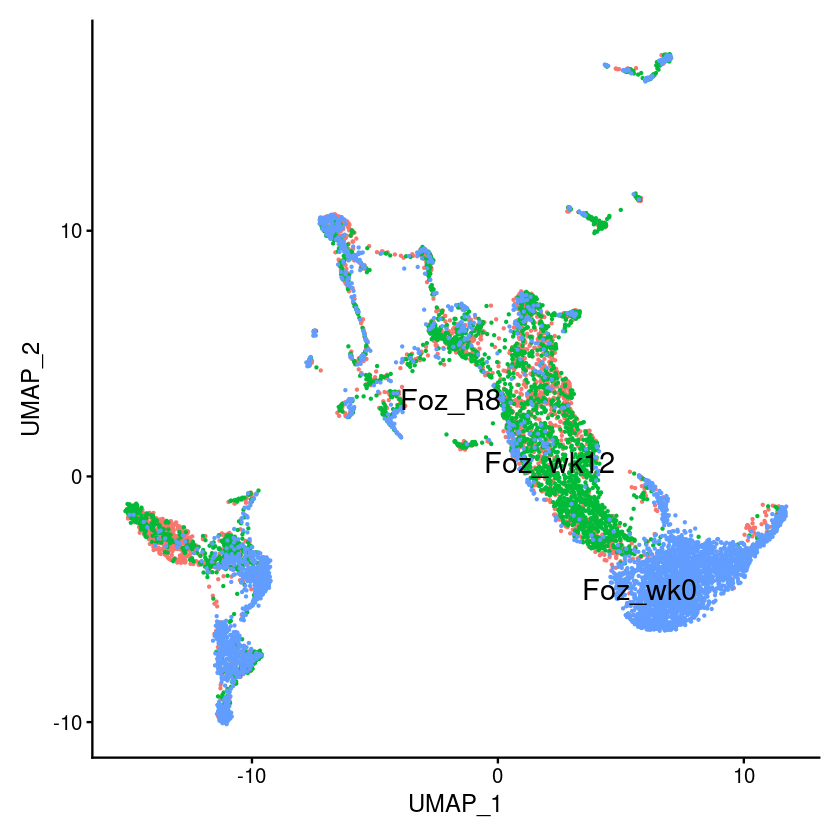

In [9]:
DimPlot(NPC, reduction = "umap",label=TRUE,repel=TRUE,label.size=6)+ NoLegend()

,orig.ident,nCount_RNA,nFeature_RNA,percent.mt,RNA_snn_res.0.5,seurat_clusters,condition
,<chr>,<dbl>,<int>,<dbl>,<fct>,<fct>,<fct>
NPC_1215_AAACCCACATAAGATG,NPC_1215,9837,2341,4.788045,9,9,Foz_R8
NPC_1215_AAACGCTTCGCACGGT,NPC_1215,12615,3072,3.281807,9,9,Foz_R8
NPC_1215_AAACGCTTCGGCGATC,NPC_1215,6734,2288,4.054054,2,2,Foz_R8
NPC_1215_AAAGGATCATATGCGT,NPC_1215,2579,1034,4.536642,4,4,Foz_R8
NPC_1215_AAAGGGCAGCTGAAGC,NPC_1215,2916,1333,4.801097,15,15,Foz_R8
NPC_1215_AAAGGTAAGCCAGTAG,NPC_1215,1694,804,3.246753,6,6,Foz_R8


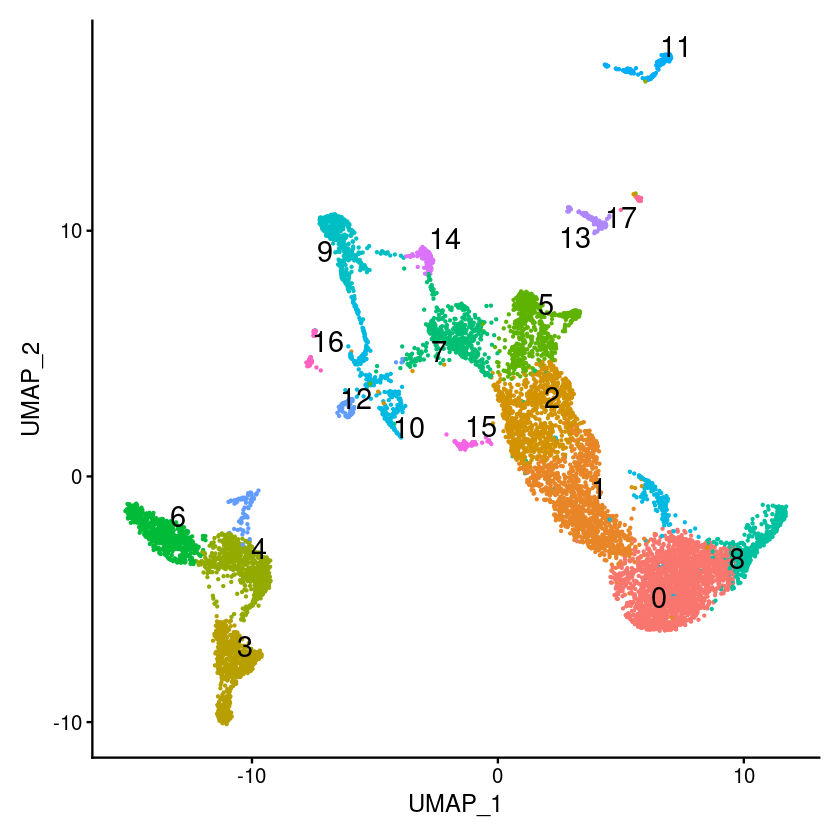

In [11]:
head(NPC@meta.data)
Idents(NPC)=NPC@meta.data$seurat_clusters
DimPlot(NPC, reduction = "umap",label=TRUE,repel=TRUE,label.size=6)+ NoLegend()

In [12]:
saveRDS(NPC,'NPC_filtered_230731.rds')

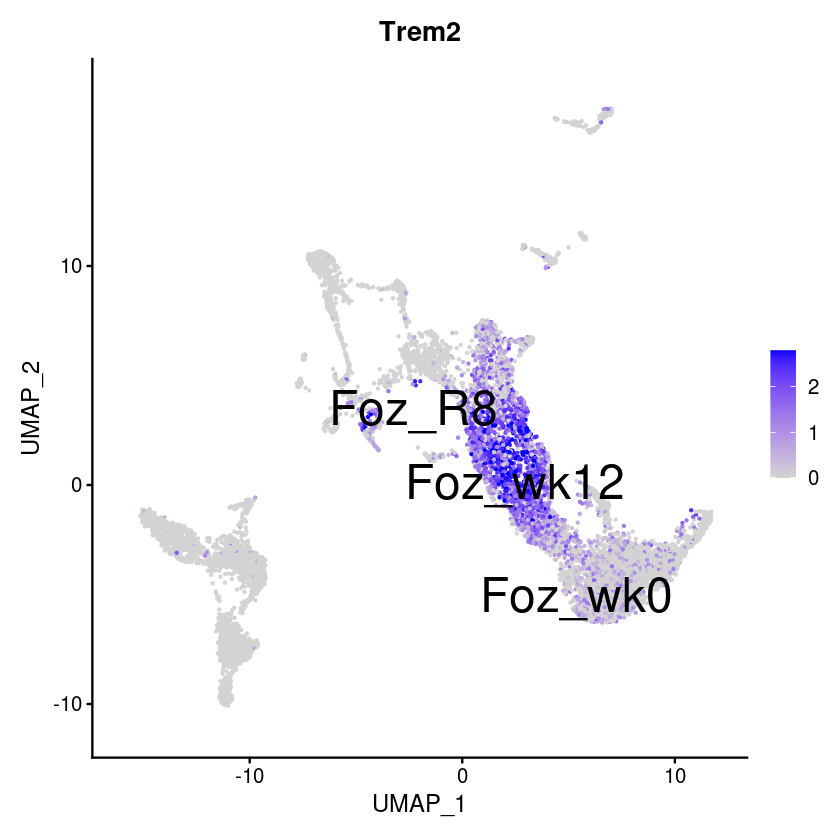

In [10]:
focal_gene='Trem2'
FeaturePlot(NPC, features = c(focal_gene),max.cutoff='q95',label=TRUE,label.size=10,repel=TRUE)

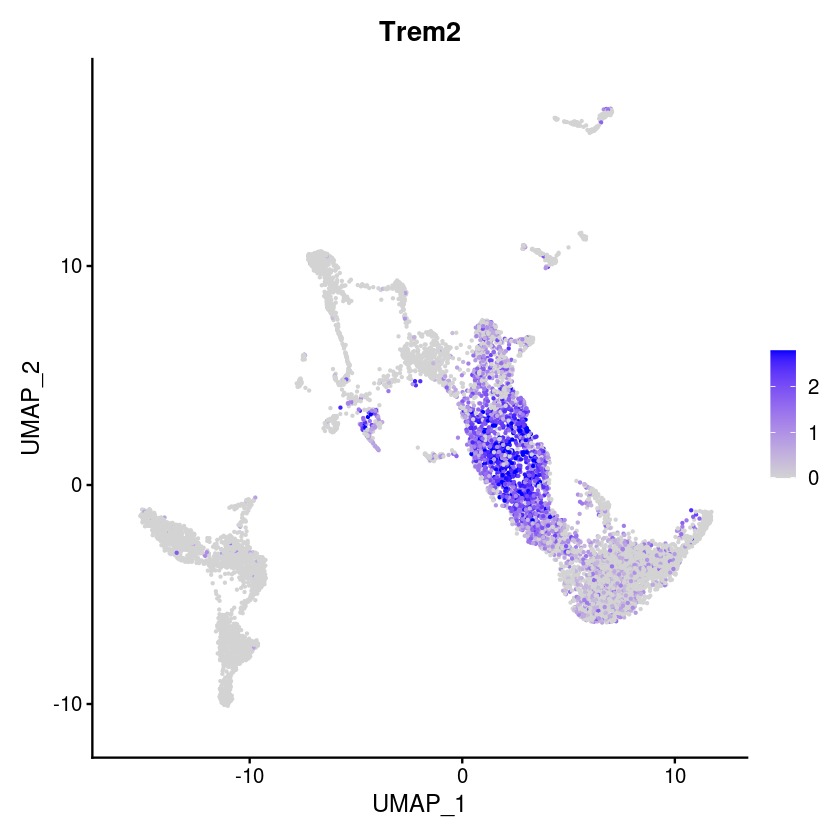

In [13]:
focal_gene='Trem2'
FeaturePlot(NPC, features = c(focal_gene),max.cutoff='q95',label=FALSE,label.size=10,repel=TRUE)

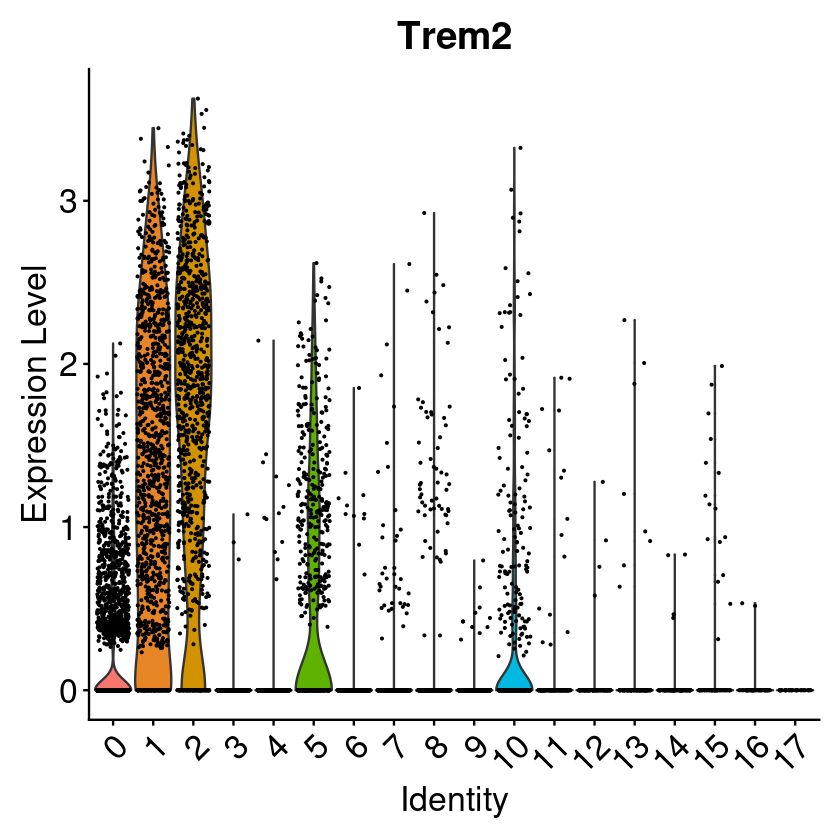

In [10]:
ggp=VlnPlot(NPC,features='Trem2')
ggp+theme(text = element_text(size = 20),axis.text = element_text(size = 20)) + theme(legend.position = 'none')

In [16]:
library(dittoSeq)

In [14]:
# options(repr.plot.width=12, repr.plot.height=5)
# dittoBarPlot(NPC, "condition",group.by = "RNA_snn_res.0.5",
#             x.reorder=c(1,2,13,14,15,16,17,18,19,20,3,4,5,6,7,8,9,10,11,12),
#             color.panel =c('#9E9E9E','#E72323'))+theme(text = element_text(size = 20),axis.text = element_text(size = 20))

# Make a requested violin plot

In [11]:
table(Idents(NPC))
head(NPC@meta.data)
Idents(NPC)=NPC@meta.data$seurat_clusters
table(Idents(NPC))


  Foz_R8 Foz_wk12  Foz_wk0 
    2237     2914     4351 

,orig.ident,nCount_RNA,nFeature_RNA,percent.mt,RNA_snn_res.0.5,seurat_clusters,condition
,<chr>,<dbl>,<int>,<dbl>,<fct>,<fct>,<fct>
NPC_1215_AAACCCACATAAGATG,NPC_1215,9837,2341,4.788045,9,9,Foz_R8
NPC_1215_AAACGCTTCGCACGGT,NPC_1215,12615,3072,3.281807,9,9,Foz_R8
NPC_1215_AAACGCTTCGGCGATC,NPC_1215,6734,2288,4.054054,2,2,Foz_R8
NPC_1215_AAAGGATCATATGCGT,NPC_1215,2579,1034,4.536642,4,4,Foz_R8
NPC_1215_AAAGGGCAGCTGAAGC,NPC_1215,2916,1333,4.801097,15,15,Foz_R8
NPC_1215_AAAGGTAAGCCAGTAG,NPC_1215,1694,804,3.246753,6,6,Foz_R8



   0    1    2    3    4    5    6    7    8    9   10   11   12   13   14   15 
2218 1122  943  665  663  622  616  535  472  446  434  182  140  133  125   83 
  16   17 
  64   39 

In [12]:
# subset to myeloid and no regression cells
NPC_myeloid = subset(NPC,idents=c(0,8,5,15,1,2))
Idents(NPC_myeloid)=NPC_myeloid@meta.data$condition
table(Idents(NPC_myeloid))
NPC_myeloid_NOREG = subset(NPC_myeloid,idents=c('Foz_wk0','Foz_wk12'))
table(Idents(NPC_myeloid_NOREG))
Idents(NPC_myeloid_NOREG)=NPC_myeloid_NOREG@meta.data$seurat_clusters
table(Idents(NPC_myeloid_NOREG))


  Foz_R8 Foz_wk12  Foz_wk0 
    1010     1645     2805 


Foz_wk12  Foz_wk0 
    1645     2805 


   0    1    2    5    8   15 
2194  870  532  375  433   46 

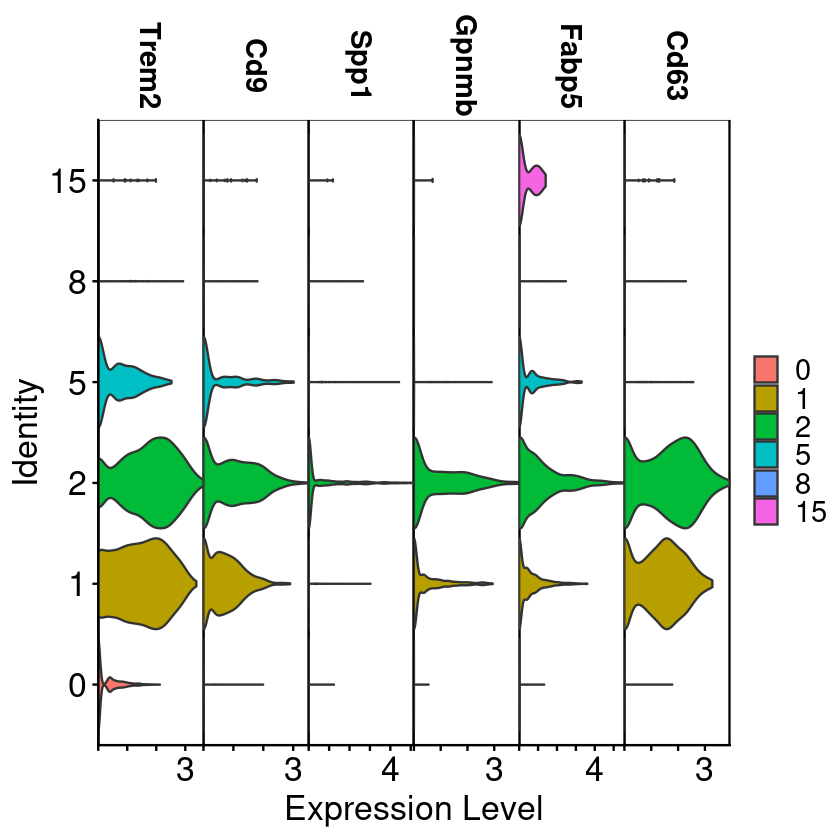

In [13]:
VlnPlot(NPC_myeloid_NOREG,features=c('Trem2','Cd9','Spp1','Gpnmb','Fabp5','Cd63'),pt.size=0,
       stack=TRUE,fill.by='ident')+ theme(text = element_text(size = 20),axis.text = element_text(size = 20),
                                         axis.text.x = element_text(size = 20))     

# In a violin plot we want to show, how the expression of Trem2 change during regression   ​

Type of plot - Violin plot ​

Clusters - 1_NASH vs 1_REG, 2_NASH vs 2_REG​

Markers to show - Trem2​

In [22]:

levels(NPC_temp@meta.data$condition)

[1] "Foz_wk0"  "Foz_wk12" "Foz_R8"


  Foz_R8 Foz_wk12  Foz_wk0 
     663     1254      148 


  Foz_R8 Foz_wk12 
     663     1254 


   1    2 
1065  852 

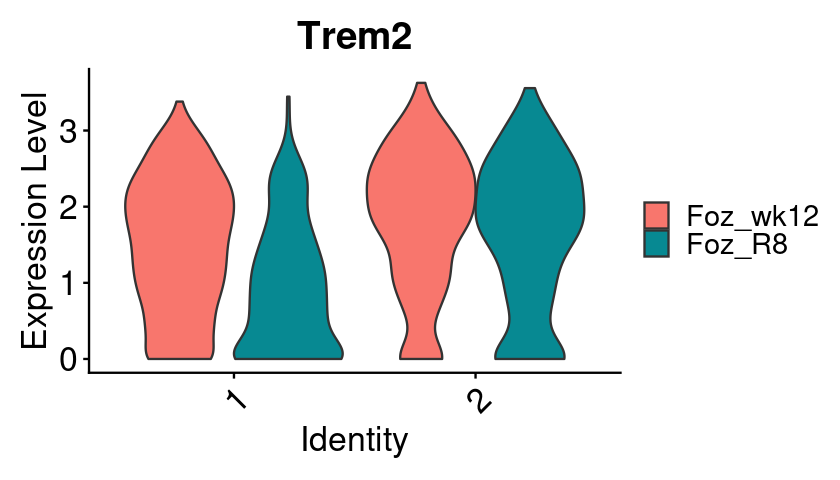

In [24]:
# subset to myeloid and no regression cells
options(repr.plot.width=7, repr.plot.height=4)
NPC_temp = subset(NPC,idents=c(1,2))
Idents(NPC_temp)=NPC_temp@meta.data$condition
table(Idents(NPC_temp))
NPC_temp = subset(NPC_temp,idents=c('Foz_wk12','Foz_R8'))
table(Idents(NPC_temp))
Idents(NPC_temp)=NPC_temp@meta.data$seurat_clusters
# reorder level of factors
NPC_temp@meta.data$condition=factor(NPC_temp@meta.data$condition,levels=c('Foz_wk12','Foz_R8'))
table(Idents(NPC_temp))

VlnPlot(NPC_temp,features=c('Trem2'),pt.size=0,split.by='condition',
       fill.by='ident')+ theme(text = element_text(size = 20),axis.text = element_text(size = 20),
                                         axis.text.x = element_text(size = 20))     

In [34]:
NPC_temp

An object of class Seurat 
17556 features across 1917 samples within 1 assay 
Active assay: RNA (17556 features, 2000 variable features)
 3 dimensional reductions calculated: pca, tsne, umap

# Extract Trem2 + genes from clusters 1,2,5, save out average expression by cluster

In [15]:
table(Idents(NPC))


  Foz_R8 Foz_wk12  Foz_wk0 
    2237     2914     4351 

In [18]:
NPC_NASH = subset(x=NPC,idents='Foz_wk12')
Trem2_temp = GetAssayData(object = NPC_NASH, assay = "RNA", slot = "data")['Trem2',1:nrow(NPC_NASH@meta.data)]

length(Trem2_temp)

NPC_NASH@meta.data['Trem2']=Trem2_temp
head(NPC_NASH@meta.data)

NPC_NASH@meta.data['Trem2_high']=NPC_NASH@meta.data['Trem2']>0
head(NPC_NASH@meta.data)

table(NPC_NASH@meta.data['Trem2_high'])

[1] 2914

,orig.ident,nCount_RNA,nFeature_RNA,percent.mt,RNA_snn_res.0.5,seurat_clusters,condition,Trem2
,<chr>,<dbl>,<int>,<dbl>,<fct>,<fct>,<fct>,<dbl>
NPC_2722_AAACCCAAGGCGCTTC,NPC_2722,28974,5116,4.617933,1,1,Foz_wk12,1.7023418
NPC_2722_AAACCCAAGGTCCCGT,NPC_2722,4149,1601,4.820439,4,4,Foz_wk12,0.0000000
NPC_2722_AAACCCACATCCTTGC,NPC_2722,3565,1298,3.786816,16,16,Foz_wk12,0.0000000
NPC_2722_AAACCCAGTTCTCCCA,NPC_2722,25045,4780,4.855261,1,1,Foz_wk12,1.3336763
NPC_2722_AAACGAACAGACAAGC,NPC_2722,27718,4860,3.044953,1,1,Foz_wk12,0.3080554
NPC_2722_AAACGCTTCATACGGT,NPC_2722,12938,3718,4.614314,0,0,Foz_wk12,0.9344583


,orig.ident,nCount_RNA,nFeature_RNA,percent.mt,RNA_snn_res.0.5,seurat_clusters,condition,Trem2,Trem2_high
,<chr>,<dbl>,<int>,<dbl>,<fct>,<fct>,<fct>,<dbl>,"<lgl[,1]>"
NPC_2722_AAACCCAAGGCGCTTC,NPC_2722,28974,5116,4.617933,1,1,Foz_wk12,1.7023418,TRUE
NPC_2722_AAACCCAAGGTCCCGT,NPC_2722,4149,1601,4.820439,4,4,Foz_wk12,0.0000000,FALSE
NPC_2722_AAACCCACATCCTTGC,NPC_2722,3565,1298,3.786816,16,16,Foz_wk12,0.0000000,FALSE
NPC_2722_AAACCCAGTTCTCCCA,NPC_2722,25045,4780,4.855261,1,1,Foz_wk12,1.3336763,TRUE
NPC_2722_AAACGAACAGACAAGC,NPC_2722,27718,4860,3.044953,1,1,Foz_wk12,0.3080554,TRUE
NPC_2722_AAACGCTTCATACGGT,NPC_2722,12938,3718,4.614314,0,0,Foz_wk12,0.9344583,TRUE



FALSE  TRUE 
 1458  1456 

In [19]:
NPC_trem2pos = subset(x=NPC_NASH,subset=Trem2>0)
table(NPC_trem2pos@meta.data$Trem2_high)

Warning message:
“The following variables were found in both object metadata and the default assay: Trem2
Returning metadata; if you want the feature, please use the assay's key (eg. rna_Trem2)”



TRUE 
1456 

In [21]:
Idents(NPC_trem2pos)=NPC_trem2pos@meta.data$seurat_clusters
table(Idents(NPC_trem2pos))


  0   1   2   4   5   6   7   8   9  10  11  12  13  14  15  16 
 14 734 396   6 173   6  22   7   7  59   9   4   6   2   9   2 

In [22]:
avg_exp_trem2pos = AverageExpression(NPC_trem2pos)
head(avg_exp_trem2pos)

,0,1,2,4,5,6,7,8,9,10,11,12,13,14,15,16
Sox17,0.00000000,7.848904e-04,0.001676572,0.0000000,0.000000000,0.0000000,0.03923908,0.0000000,0.00000000,0.000000000,0.16865131,0.0000000,0.00000000,0.0000000,0.00000000,0.0000000
Mrpl15,0.59669240,4.871484e-01,0.685266972,0.0000000,0.634359238,0.3184916,0.76527014,1.3789486,0.58507822,0.745360015,0.79894302,0.6061063,0.00000000,0.5924873,0.60289993,0.3521375
Lypla1,0.40318690,3.775930e-01,0.413348136,0.7020350,0.612411099,1.7654985,0.34430323,0.0000000,0.39415711,0.487401672,0.44344652,0.1965409,1.61799897,0.2962436,0.38652256,0.7042749
Tcea1,0.57916214,8.335645e-01,0.833383899,0.5070480,0.843769976,0.3110033,1.00429879,0.8737440,1.31103999,0.991714345,1.13529665,0.7345113,0.53184033,1.1501806,1.36784067,0.7042749
Atp6v1h,0.37869381,6.252769e-01,0.686669780,0.0000000,0.684490949,1.3612169,0.34205456,0.0000000,0.50890966,0.463531327,0.39103810,0.4444719,1.07181136,0.5576934,0.23154201,1.0296902
Rb1cc1,0.57330847,6.219539e-01,0.444014909,1.2649488,0.558647930,0.3110033,0.40235641,0.3230600,0.15706140,0.475341263,1.29959943,0.2828374,1.06064824,0.0000000,0.99115724,0.0000000
4732440D04Rik,0.00000000,1.375747e-02,0.009754178,0.0000000,0.005074486,0.0000000,0.00000000,0.0000000,0.00000000,0.006544327,0.00000000,0.0000000,0.00000000,0.0000000,0.00000000,0.0000000
St18,0.00000000,4.062816e-03,0.016362172,0.0000000,0.000000000,0.0000000,0.00000000,0.0000000,0.00000000,0.006742711,0.00000000,0.0000000,0.00000000,0.0000000,0.00000000,0.0000000
Pcmtd1,0.55786113,5.416927e-01,0.355378970,2.0281919,0.288862413,0.3110033,0.67891524,0.0000000,0.14214696,0.263644115,0.68858212,0.7526720,1.26607288,0.0000000,0.31645793,0.3387763
Gm26901,0.00000000,2.749846e-03,0.000000000,0.0000000,0.000000000,0.0000000,0.00000000,0.0000000,0.00000000,0.000000000,0.00000000,0.0000000,0.00000000,0.0000000,0.00000000,0.0000000


In [23]:
write.csv(avg_exp_trem2pos$RNA,'avg_exp_cluster_trem2pos_NPC_REG_NASH_ONLY_230111.csv')

# Save out average expression in trem2+cells in REG only

In [9]:
table(Idents(NPC))


  Foz_R8 Foz_wk12  Foz_wk0 
    2237     2914     4351 

In [25]:
NPC_NASH = subset(x=NPC,idents='Foz_R8')
Trem2_temp = GetAssayData(object = NPC_NASH, assay = "RNA", slot = "data")['Trem2',1:nrow(NPC_NASH@meta.data)]

length(Trem2_temp)

NPC_NASH@meta.data['Trem2']=Trem2_temp
head(NPC_NASH@meta.data)

NPC_NASH@meta.data['Trem2_high']=NPC_NASH@meta.data['Trem2']>0
head(NPC_NASH@meta.data)

table(NPC_NASH@meta.data['Trem2_high'])

NPC_trem2pos = subset(x=NPC_NASH,subset=Trem2>0)
table(NPC_trem2pos@meta.data$Trem2_high)

Idents(NPC_trem2pos)=NPC_trem2pos@meta.data$seurat_clusters
table(Idents(NPC_trem2pos))

avg_exp_trem2pos = AverageExpression(NPC_trem2pos)
head(avg_exp_trem2pos)

write.csv(avg_exp_trem2pos$RNA,'avg_exp_cluster_trem2pos_NPC_REG_REG_ONLY_230111.csv')

[1] 2237

,orig.ident,nCount_RNA,nFeature_RNA,percent.mt,RNA_snn_res.0.5,seurat_clusters,condition,Trem2
,<chr>,<dbl>,<int>,<dbl>,<fct>,<fct>,<fct>,<dbl>
NPC_1215_AAACCCACATAAGATG,NPC_1215,9837,2341,4.788045,9,9,Foz_R8,0.000000
NPC_1215_AAACGCTTCGCACGGT,NPC_1215,12615,3072,3.281807,9,9,Foz_R8,0.000000
NPC_1215_AAACGCTTCGGCGATC,NPC_1215,6734,2288,4.054054,2,2,Foz_R8,1.937303
NPC_1215_AAAGGATCATATGCGT,NPC_1215,2579,1034,4.536642,4,4,Foz_R8,0.000000
NPC_1215_AAAGGGCAGCTGAAGC,NPC_1215,2916,1333,4.801097,15,15,Foz_R8,0.000000
NPC_1215_AAAGGTAAGCCAGTAG,NPC_1215,1694,804,3.246753,6,6,Foz_R8,0.000000


,orig.ident,nCount_RNA,nFeature_RNA,percent.mt,RNA_snn_res.0.5,seurat_clusters,condition,Trem2,Trem2_high
,<chr>,<dbl>,<int>,<dbl>,<fct>,<fct>,<fct>,<dbl>,"<lgl[,1]>"
NPC_1215_AAACCCACATAAGATG,NPC_1215,9837,2341,4.788045,9,9,Foz_R8,0.000000,FALSE
NPC_1215_AAACGCTTCGCACGGT,NPC_1215,12615,3072,3.281807,9,9,Foz_R8,0.000000,FALSE
NPC_1215_AAACGCTTCGGCGATC,NPC_1215,6734,2288,4.054054,2,2,Foz_R8,1.937303,TRUE
NPC_1215_AAAGGATCATATGCGT,NPC_1215,2579,1034,4.536642,4,4,Foz_R8,0.000000,FALSE
NPC_1215_AAAGGGCAGCTGAAGC,NPC_1215,2916,1333,4.801097,15,15,Foz_R8,0.000000,FALSE
NPC_1215_AAAGGTAAGCCAGTAG,NPC_1215,1694,804,3.246753,6,6,Foz_R8,0.000000,FALSE



FALSE  TRUE 
 1523   714 

Warning message:
“The following variables were found in both object metadata and the default assay: Trem2
Returning metadata; if you want the feature, please use the assay's key (eg. rna_Trem2)”



TRUE 
 714 


  0   1   2   4   5   6   7   8   9  10  11  13  14  15 
 11 180 344   1 114   5  11  10   3  23   3   1   1   7 

,0,1,2,4,5,6,7,8,9,10,11,13,14,15
Sox17,0.00000000,0.000000000,0.000000000,0.000000,0.000000000,0.0000000,0.00000000,0.0000000,0.0000000,0.00000000,0.0000000,0.0000000,0.000000,0.00000000
Mrpl15,0.37383438,0.389368705,0.620995186,0.000000,0.688211803,0.4611483,0.78880546,0.1933488,0.4051207,0.44086954,0.0000000,0.0000000,0.000000,0.25661676
Lypla1,0.62478425,0.397711276,0.379784595,0.000000,0.756722193,0.2065476,0.48783460,0.4688233,0.5447134,0.27882775,1.2570569,2.2428230,0.000000,0.61156941
Tcea1,1.54390620,0.838551474,0.868556239,1.878287,0.842636944,1.6428649,0.78531678,1.1825368,1.6963698,1.11708044,1.0635275,0.0000000,2.594034,2.19205481
Atp6v1h,0.56075844,0.695749894,0.597867807,0.000000,0.426756365,2.1565923,0.60033888,0.9763087,0.1395927,0.52665409,0.3098181,0.0000000,1.297017,0.13489815
Rb1cc1,0.74833210,0.660737066,0.462654540,3.756574,0.523209434,0.2065476,0.74836688,0.0000000,0.6213384,0.41032427,0.8349818,0.0000000,2.594034,0.39590043
4732440D04Rik,0.00000000,0.017901929,0.012229503,0.000000,0.000000000,0.0000000,0.00000000,0.0000000,0.0000000,0.00000000,0.0000000,0.0000000,0.000000,0.00000000
St18,0.00000000,0.003955540,0.020292902,0.000000,0.000000000,0.0000000,0.00000000,0.0000000,0.0000000,0.00000000,0.0000000,0.0000000,0.000000,0.00000000
Pcmtd1,1.22705724,0.440619016,0.453322356,0.000000,0.432496202,2.0263087,0.51927380,1.0188985,0.7470277,0.47694605,0.3230183,0.0000000,0.000000,1.31013626
Gm26901,0.00000000,0.001491344,0.001786161,0.000000,0.000000000,0.0000000,0.00000000,0.0000000,0.0000000,0.00000000,0.0000000,0.0000000,0.000000,0.00000000


# Compute NASH vs REG in clusters of interest

In [10]:
Idents(NPC)=NPC@meta.data$seurat_clusters
table(Idents(NPC))


   0    1    2    3    4    5    6    7    8    9   10   11   12   13   14   15 
2218 1122  943  665  663  622  616  535  472  446  434  182  140  133  125   83 
  16   17 
  64   39 

In [11]:
focal_clusters = c(0,8,1,2,5,15)
NPC_macrophage = subset(NPC,idents=focal_clusters)
table(Idents(NPC_macrophage))


   0    1    2    5    8   15 
2218 1122  943  622  472   83 

In [18]:
NPC_macrophage@meta.data$cluster.condition=paste0(NPC_macrophage@meta.data$condition,'_',NPC_macrophage@meta.data$seurat_clusters)
head(NPC_macrophage@meta.data)

,orig.ident,nCount_RNA,nFeature_RNA,percent.mt,RNA_snn_res.0.5,seurat_clusters,condition,cluster.condition
,<chr>,<dbl>,<int>,<dbl>,<fct>,<fct>,<fct>,<chr>
NPC_1215_AAACGCTTCGGCGATC,NPC_1215,6734,2288,4.054054,2,2,Foz_R8,Foz_R8_2
NPC_1215_AAAGGGCAGCTGAAGC,NPC_1215,2916,1333,4.801097,15,15,Foz_R8,Foz_R8_15
NPC_1215_AAAGTGATCACTGTTT,NPC_1215,23336,4703,4.435207,2,2,Foz_R8,Foz_R8_2
NPC_1215_AAAGTGATCGCAACAT,NPC_1215,12987,2971,4.404404,2,2,Foz_R8,Foz_R8_2
NPC_1215_AAAGTGATCTAGTACG,NPC_1215,7916,2292,2.880243,2,2,Foz_R8,Foz_R8_2
NPC_1215_AACAAAGAGTTACTCG,NPC_1215,6438,2076,2.143523,1,1,Foz_R8,Foz_R8_1


In [17]:
# NASH vs REG in all macrophage clusters
Idents(NPC_macrophage)=NPC_macrophage@meta.data$condition
NASHvsREG_all_macrophage=FindMarkers(NPC_macrophage,ident.1='Foz_wk12',
                                    ident.2='Foz_R8',min.pct=0.1)
head(NASHvsREG_all_macrophage)


,p_val,avg_log2FC,pct.1,pct.2,p_val_adj
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Scd1,1.578545e-65,0.6781638,0.612,0.278,2.771294e-61
Plxdc2,6.292660e-48,0.3202817,0.375,0.109,1.104739e-43
Vcam1,5.820741e-47,0.9650586,0.604,0.351,1.021889e-42
Acot1,2.105322e-46,0.3427864,0.416,0.146,3.696104e-42
Dysf,5.252674e-41,0.3026730,0.364,0.122,9.221594e-37
Gm42418,5.041669e-40,-0.6637927,1.000,1.000,8.851155e-36


In [27]:
write.csv(NASHvsREG_all_macrophage,'Foz_wk12.vs.Foz_R8.all_macrophages.csv')

In [12]:

n_clust = focal_clusters

In [25]:
# comparison by condition within all clusters
group1="Foz_wk12"
group2="Foz_R8"
for (i in n_clust){
    #if group membership < 3, next
    if (length(which(NPC_macrophage@meta.data$cluster.condition == paste0(group1, "_", i))) < 3 | 
        length(which(NPC_macrophage@meta.data$cluster.condition == paste0(group2, "_", i))) < 3){
        print("One group has less than 3 cells")
        next
    }
    degs <- FindMarkers(NPC_macrophage, 
                        min.pct = 0.1, 
                        ident.1 = paste0(group1, "_", i), 
                        ident.2 = paste0(group2, "_", i),
                        group.by = "cluster.condition")


    write.csv(degs, file = paste0(group1,'.vs.',group2,'.cluster',i,'.csv'))
    }


In [13]:
# NASH vs healthy in all macrophage clusters
Idents(NPC_macrophage)=NPC_macrophage@meta.data$condition
NASHvsCTRL_all_macrophage=FindMarkers(NPC_macrophage,ident.1='Foz_wk12',
                                    ident.2='Foz_wk0',min.pct=0.1)
head(NASHvsCTRL_all_macrophage)
write.csv(NASHvsCTRL_all_macrophage,'Foz_wk12.vs.Foz_wk0.all_macrophages.csv')

,p_val,avg_log2FC,pct.1,pct.2,p_val_adj
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Slc40a1,0,-2.1287090,0.629,0.967,0
Cfh,0,-1.3132863,0.417,0.852,0
Mrc1,0,-1.2859404,0.716,0.959,0
Fcna,0,-2.5902147,0.469,0.944,0
Rpl12,0,0.8897935,0.992,0.942,0
Serinc3,0,-0.9741080,0.962,0.980,0


In [21]:
# comparison by condition within all clusters
group1="Foz_wk12"
group2="Foz_wk0"
for (i in n_clust){
    #if group membership < 3, next
    if (length(which(NPC_macrophage@meta.data$cluster.condition == paste0(group1, "_", i))) < 3 | 
        length(which(NPC_macrophage@meta.data$cluster.condition == paste0(group2, "_", i))) < 3){
        print("One group has less than 3 cells")
        next
    }
    degs <- FindMarkers(NPC_macrophage, 
                        min.pct = 0.1, 
                        ident.1 = paste0(group1, "_", i), 
                        ident.2 = paste0(group2, "_", i),
                        group.by = "cluster.condition")


    write.csv(degs, file = paste0(group1,'.vs.',group2,'.cluster',i,'.csv'))
    }


[1] "One group has less than 3 cells"


In [20]:
table(NPC_macrophage@meta.data$cluster.condition)


   Foz_R8_0    Foz_R8_1   Foz_R8_15    Foz_R8_2    Foz_R8_5    Foz_R8_8 
         24         252          37         411         247          39 
  Foz_wk0_0   Foz_wk0_1  Foz_wk0_15   Foz_wk0_2   Foz_wk0_5   Foz_wk0_8 
       2174          57           2          91          68         413 
 Foz_wk12_0  Foz_wk12_1 Foz_wk12_15  Foz_wk12_2  Foz_wk12_5  Foz_wk12_8 
         20         813          44         441         307          20 

In [22]:
head(NPC_macrophage@meta.data)

,orig.ident,nCount_RNA,nFeature_RNA,percent.mt,RNA_snn_res.0.5,seurat_clusters,condition,cluster.condition
,<chr>,<dbl>,<int>,<dbl>,<fct>,<fct>,<fct>,<chr>
NPC_1215_AAACGCTTCGGCGATC,NPC_1215,6734,2288,4.054054,2,2,Foz_R8,Foz_R8_2
NPC_1215_AAAGGGCAGCTGAAGC,NPC_1215,2916,1333,4.801097,15,15,Foz_R8,Foz_R8_15
NPC_1215_AAAGTGATCACTGTTT,NPC_1215,23336,4703,4.435207,2,2,Foz_R8,Foz_R8_2
NPC_1215_AAAGTGATCGCAACAT,NPC_1215,12987,2971,4.404404,2,2,Foz_R8,Foz_R8_2
NPC_1215_AAAGTGATCTAGTACG,NPC_1215,7916,2292,2.880243,2,2,Foz_R8,Foz_R8_2
NPC_1215_AACAAAGAGTTACTCG,NPC_1215,6438,2076,2.143523,1,1,Foz_R8,Foz_R8_1


In [23]:
# expression average norm by condition, and condition.cluster
Idents(NPC_macrophage)=NPC_macrophage@meta.data$condition
table(Idents(NPC_macrophage))
exp_avg_macrophage_df = AverageExpression(NPC_macrophage)
head(exp_avg_macrophage_df)
write.csv(exp_avg_macrophage_df$RNA,'exp_avg_macrophage_condition.csv')


  Foz_R8 Foz_wk12  Foz_wk0 
    1010     1645     2805 

,Foz_R8,Foz_wk12,Foz_wk0
Sox17,0.000000e+00,7.538189e-04,5.379389e-03
Mrpl15,5.772295e-01,5.648603e-01,4.202343e-01
Lypla1,4.715817e-01,4.414989e-01,5.560745e-01
Tcea1,9.663733e-01,8.719695e-01,1.174078e+00
Atp6v1h,5.937524e-01,6.306133e-01,8.029363e-01
Rb1cc1,4.985684e-01,5.881860e-01,8.018286e-01
4732440D04Rik,1.003306e-02,1.194395e-02,8.100029e-03
St18,1.099634e-02,6.855160e-03,1.553404e-04
Pcmtd1,4.750661e-01,4.578968e-01,7.677851e-01
Gm26901,8.741399e-04,2.834198e-03,2.843842e-03


In [24]:
# expression average norm by condition, and condition.cluster
Idents(NPC_macrophage)=NPC_macrophage@meta.data$cluster.condition
table(Idents(NPC_macrophage))
exp_avg_macrophage_df = AverageExpression(NPC_macrophage)
head(exp_avg_macrophage_df)
write.csv(exp_avg_macrophage_df$RNA,'exp_avg_macrophage.cluster.condition.csv')


   Foz_R8_2   Foz_R8_15    Foz_R8_1    Foz_R8_5    Foz_R8_8    Foz_R8_0 
        411          37         252         247          39          24 
 Foz_wk12_1  Foz_wk12_0  Foz_wk12_2  Foz_wk12_5 Foz_wk12_15  Foz_wk12_8 
        813          20         441         307          44          20 
  Foz_wk0_0   Foz_wk0_8   Foz_wk0_1   Foz_wk0_5   Foz_wk0_2  Foz_wk0_15 
       2174         413          57          68          91           2 

,Foz_R8_2,Foz_R8_15,Foz_R8_1,Foz_R8_5,Foz_R8_8,Foz_R8_0,Foz_wk12_1,Foz_wk12_0,Foz_wk12_2,Foz_wk12_5,Foz_wk12_15,Foz_wk12_8,Foz_wk0_0,Foz_wk0_8,Foz_wk0_1,Foz_wk0_5,Foz_wk0_2,Foz_wk0_15
Sox17,0.000000000,0.00000000,0.000000000,0.000000000,0.00000000,0.00000000,7.086218e-04,0.00000000,0.001505493,0.000000000,0.00000000,0.0000000,1.622580e-03,0.027994423,0.000000000,0.00000000,0.000000000,0.0000000
Mrpl15,0.630952059,0.85866924,0.401087861,0.682608560,0.33213507,0.38658571,4.728709e-01,0.44372906,0.661450097,0.683894903,0.55837810,0.4826320,4.054965e-01,0.392374498,0.566892415,0.59200628,0.687779461,0.0000000
Lypla1,0.383562029,0.33017497,0.390759691,0.720855941,0.46166316,0.49622300,3.784122e-01,0.63613564,0.430142698,0.606100474,0.62624248,0.1286670,5.289721e-01,0.759442281,0.457321157,0.60141135,0.297180668,1.0735696
Tcea1,0.923210916,1.27769636,0.872595027,0.824090538,2.31167141,1.48846338,8.418001e-01,0.63295494,0.874250346,0.840230461,1.39435817,1.6250168,1.169286e+00,1.319070591,1.083089143,0.94552162,0.884082286,0.0000000
Atp6v1h,0.604405863,0.29840929,0.688738694,0.500832955,0.65884131,0.71980344,6.257845e-01,0.41108321,0.706596544,0.610623856,0.48417598,0.0000000,7.660871e-01,1.146794472,0.600737591,0.57979006,0.377101874,2.5764342
Rb1cc1,0.422638021,0.52382223,0.650724893,0.500916132,0.16982860,0.67234045,6.172488e-01,0.56671455,0.436568254,0.635862777,0.82022400,1.5291047,8.305895e-01,0.745729618,0.666833757,0.46719167,0.721569358,0.0000000
4732440D04Rik,0.010235886,0.00000000,0.012787092,0.010947735,0.00000000,0.00000000,1.769929e-02,0.02588662,0.008758854,0.002859564,0.00000000,0.0000000,9.545135e-03,0.003933006,0.006054826,0.00000000,0.000000000,0.0000000
St18,0.025290293,0.00000000,0.002825386,0.000000000,0.00000000,0.00000000,3.668028e-03,0.00000000,0.018808688,0.000000000,0.00000000,0.0000000,0.000000e+00,0.000000000,0.000000000,0.00000000,0.004788240,0.0000000
Pcmtd1,0.425064215,0.67265657,0.497710995,0.397118552,0.92698827,0.85679483,5.410056e-01,0.64428413,0.334197806,0.287702203,0.70984168,1.6789128,7.664610e-01,0.907891479,0.610484000,0.37140491,0.556277371,0.8588114
Gm26901,0.001494986,0.00000000,0.001065246,0.000000000,0.00000000,0.00000000,2.865464e-03,0.00000000,0.000000000,0.007598155,0.00000000,0.0000000,3.408974e-03,0.000000000,0.000000000,0.00000000,0.006218318,0.0000000
